# (17) Seed-based maps

**Motivation**: <br>

In [115]:
# HIDE CODE


import os, sys
from IPython.display import display, Latex

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-Ca-fMRI/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-Ca-fMRI/figs')
tmp_dir = os.path.join(git_dir, 'jb-Ca-fMRI/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_Ca-fMRI'))
from figures.fighelper import *
from analysis.final import *
from utils.render import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from tqdm.notebook import tqdm
%matplotlib inline
set_style()

In [116]:
# HIDE CODE


def default_props_anesth(
        num_k: int = 7,
        perc: int = 15,
        **kwargs, ):
    mice = Mice(512)
    mice.set_kws(
        desc_ca2='preproc',
        desc_bold='rabies-hp',
    )
    props_base = {
        'mice': mice,
        'num_k': num_k,
        'task': 'rest',
        'perc': f'p{perc}-sample',
        'metric': 'pearson',
        'sv_props': {
            'match_using': 'gam',
            'match_metric': 'euclidean'},
        'graph_type': 'real',
        'kw_kmeans': {'n_init': 100},
        'verbose': False,
    }
    kwargs = setup_kwargs(props_base, kwargs)
    props_ca = {'mode': 'ca2', **kwargs}
    return mice, props_ca

## Prep

In [117]:
mice = Mice(512)

bs = Base(mice, mode='ca2')
kws_show = show_kws(7)

pal = prepare_palette()
translation = {'BOLD': BOLD, 'CAS': CAS, 'CAF': CAF}

fig_dir = pjoin(fig_base_dir, 'rebuttal')
print(fig_dir)

/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/rebuttal

## Collect adjacencies

In [118]:
mode = 'bold-lite'
desc = 'rabies-hp'
band = (0.01, 0.5)

kws = {
    f"desc_{mode.split('-')[0]}": desc,
    f"band_{mode.split('-')[0]}": band,
}
mice.set_kws(**kws)
a, _ = collect_adjacencies(
    mice=mice,
    mode=mode,
    fill=1.0,
)
z = bn.nanmean(np.arctanh(a), 0)
r = np.nan_to_num(np.tanh(z))

r.shape

(540, 540)

## Plot

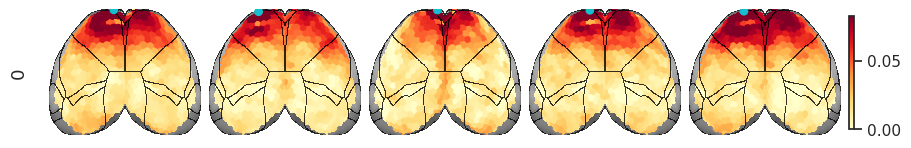

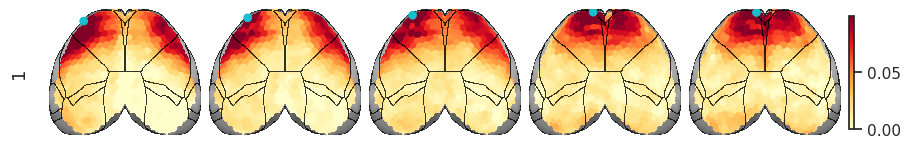

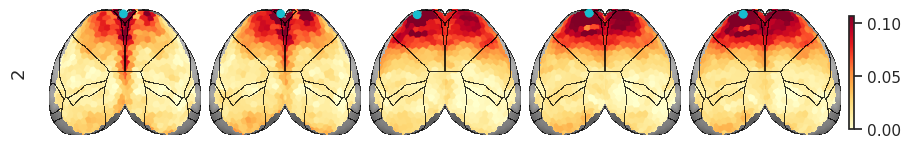

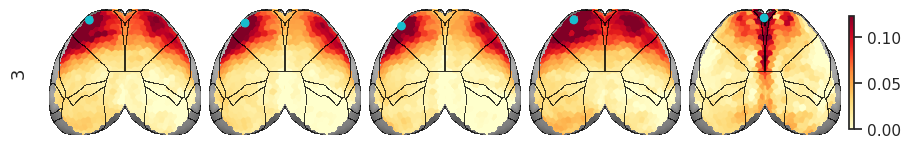

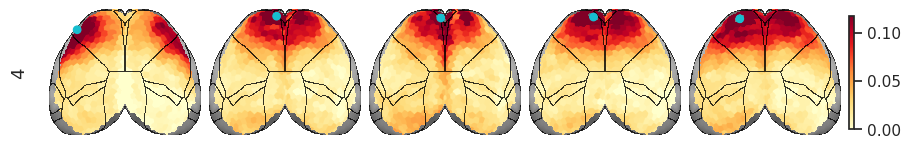

...

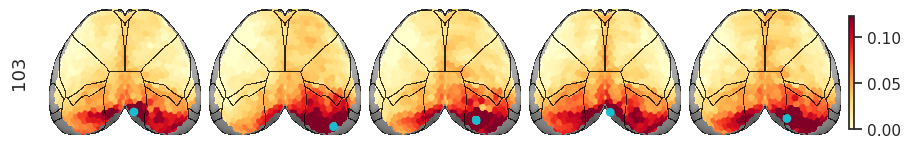

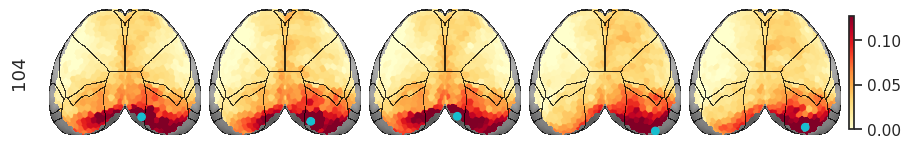

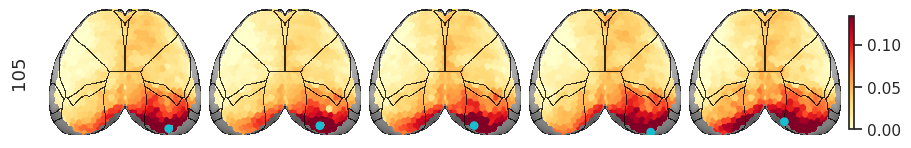

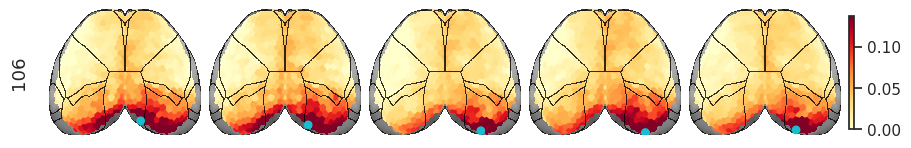

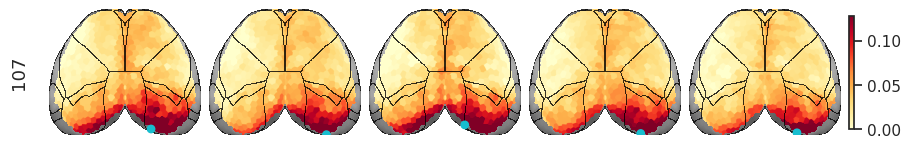

In [120]:
top, _ = mice.parcel.load_top_flat()
top = filter_boundaries(top, top > 0)


for i in range(int(np.ceil(bs.num_n / 5))):
    ids = range(i*5, min((i+1)*5, bs.num_n))
    row = r[ids]
    for j, idx in enumerate(ids):
        row[j, idx] = np.nan
    fig, axes = bs.show(
        data={i: row},
        figsize=(9, 1.5),
        vmin=0,
        vmax=np.quantile(row[row < 1], 0.95),
        add_disjoint=False,
        contour_cmap='Greys_r',
        cmap='YlOrRd',
        cbar_shrink=0.8,
        layout='constrained',
        interp='antialiased',
        cbar=True,
        display=False,
    )
    for j, ax in enumerate(axes.flat):
        x2p = top == bs.n2id[ids[j]]
        com = unique_idxs(x2p)[True]
        com = np.unravel_index(com, x2p.shape)
        com = np.array(list(zip(*com)))
        com = com.mean(0)[::-1]
        ax.add_patch(plt.Circle(
            com, 25, color='C9'))
    display(fig)

In [111]:
affil = bs.node_affiliations()

In [112]:
selected = []
for n, i in bs.n2id.items():
    if affil['regions_affil_max'][i] == 'Medial':
        selected.append(n)
selected = np.array(sorted(selected))
len(selected)

102